In [41]:
import tifffile as tiff
import numpy as np
import matplotlib.pyplot as plt
def minmax(image):
    return (image - image.min()) / (image.max() - image.min())
image = tiff.imread('/home/phillip/documents/yen-lab-discussion/rfp/Lyz Fabp1/CDKO 158.1/Jej-2.tif')
r, g, b = minmax(image[:,:,0]), minmax(image[:,:,1]), minmax(image[:,:,2])

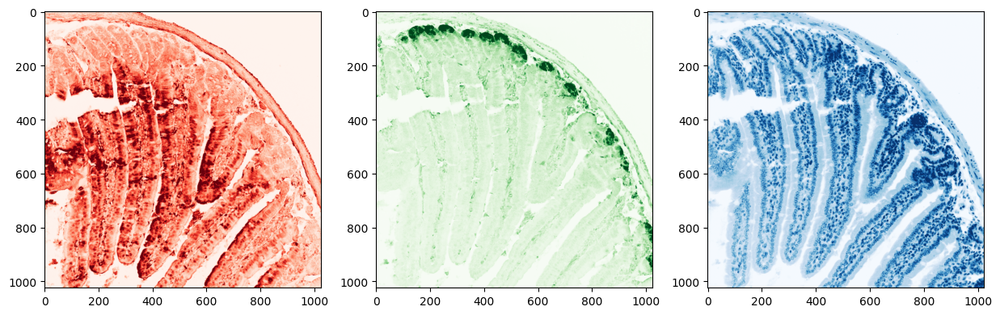

In [42]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax[0].imshow(r, cmap='Reds')
ax[1].imshow(g, cmap='Greens')
ax[2].imshow(b, cmap='Blues')
plt.show()

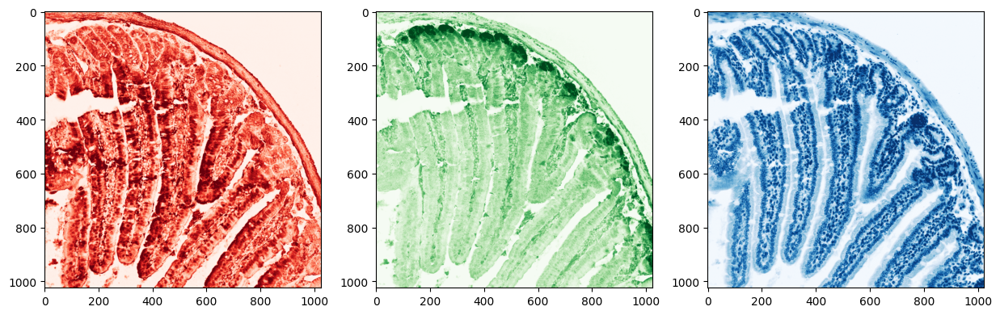

In [43]:
from skimage.exposure import equalize_adapthist
from skimage.filters import gaussian
r_eq = equalize_adapthist(
    #gaussian(
        r
        #, sigma=3)
        )
g_eq = equalize_adapthist(g)
b_eq = equalize_adapthist(
    #gaussian(
        b
        #, sigma=3)
        )
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax[0].imshow(r_eq, cmap='Reds')
ax[1].imshow(g_eq, cmap='Greens')
ax[2].imshow(b_eq, cmap='Blues')
plt.show()




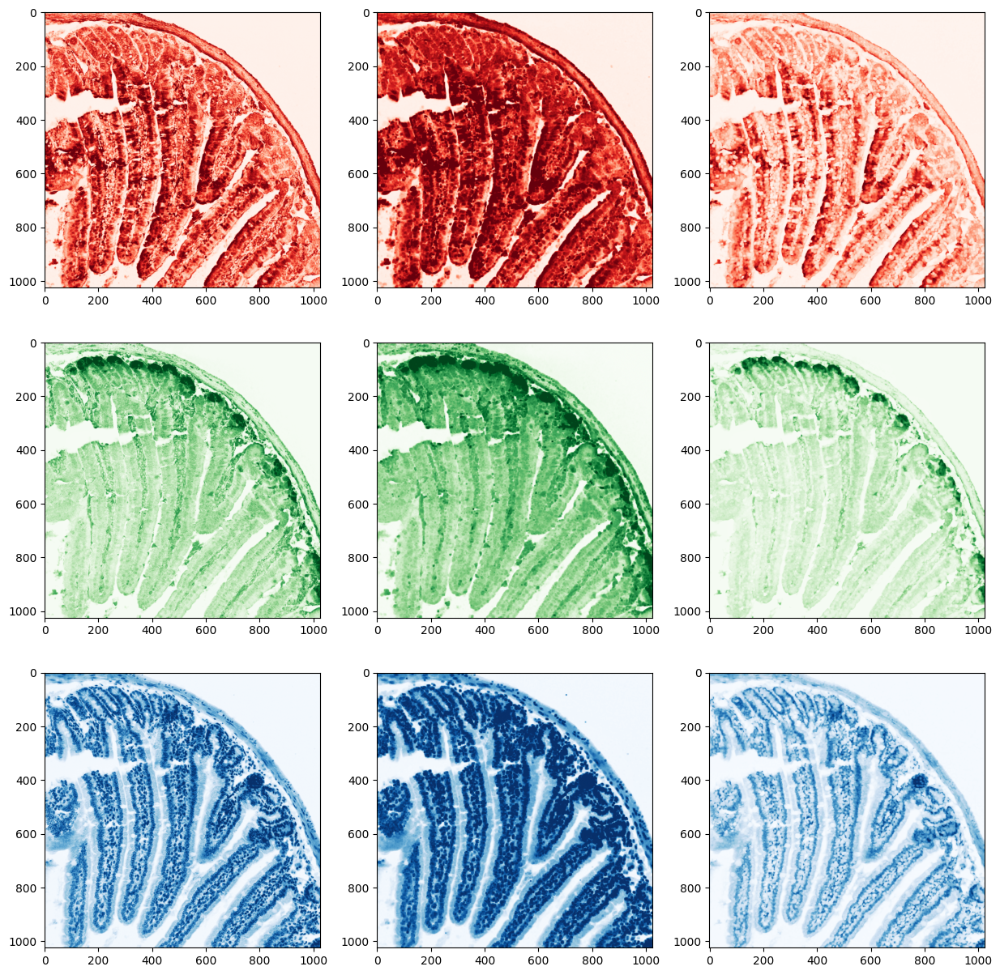

In [44]:
from skimage.morphology import dilation, erosion
# structuring element
selem = np.ones((5, 5))
# dilate and erode all 3 channels
figure, ax = plt.subplots(3,3, figsize=(15,15))
ax[0,0].imshow(r_eq, cmap='Reds')
ax[0,1].imshow(dilation(r_eq,footprint=selem), cmap='Reds')
ax[0,2].imshow(erosion(r_eq,footprint=selem), cmap='Reds')
ax[1,0].imshow(g_eq, cmap='Greens')
ax[1,1].imshow(dilation(g_eq,footprint=selem), cmap='Greens')
ax[1,2].imshow(erosion(g_eq,footprint=selem), cmap='Greens')
ax[2,0].imshow(b_eq, cmap='Blues')
ax[2,1].imshow(dilation(b_eq, footprint=selem), cmap='Blues')
ax[2,2].imshow(erosion(b_eq, footprint=selem), cmap='Blues')
plt.show()

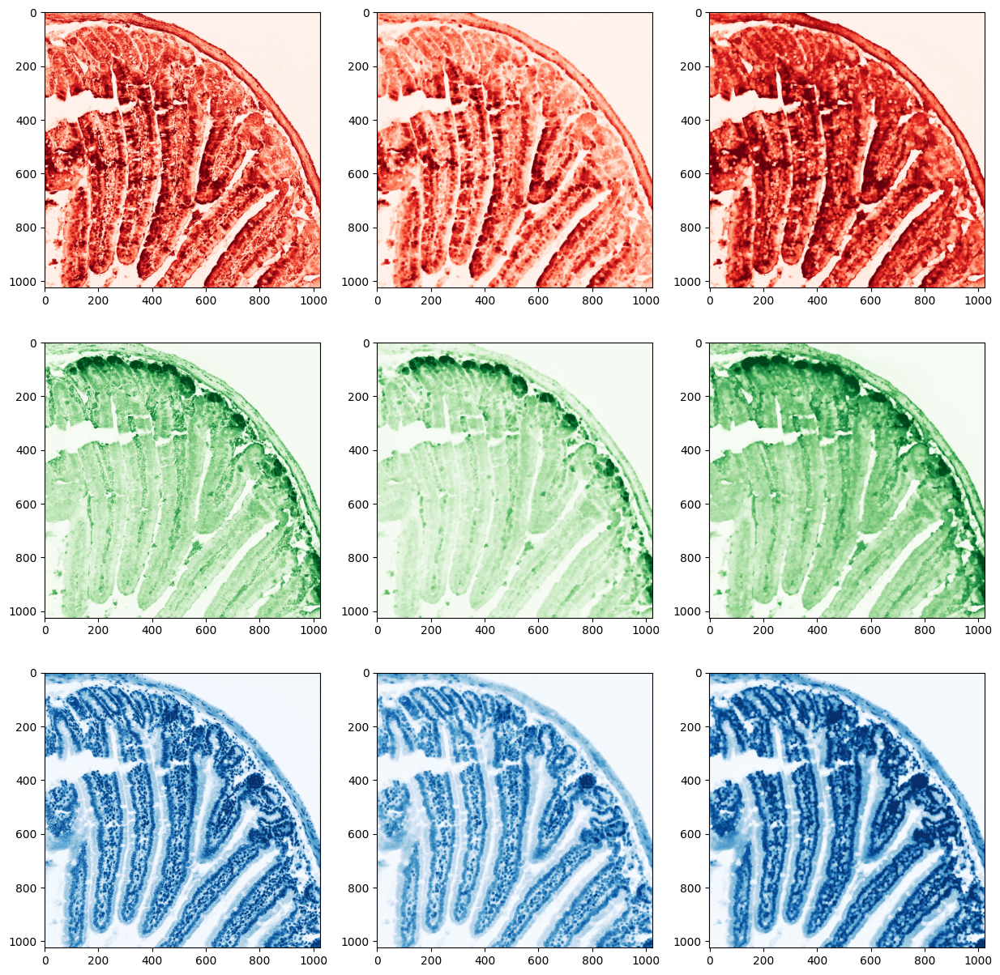

In [45]:
from skimage.morphology import opening, closing
selem = np.ones((6, 6))
# show openign and closing of all channels
figure, ax = plt.subplots(3,3, figsize=(15,15))
ax[0,0].imshow(r_eq, cmap='Reds')
ax[0,1].imshow(opening(r_eq,footprint=selem), cmap='Reds')
ax[0,2].imshow(closing(r_eq,footprint=selem), cmap='Reds')
ax[1,0].imshow(g_eq, cmap='Greens')
ax[1,1].imshow(opening(g_eq,footprint=selem), cmap='Greens')
ax[1,2].imshow(closing(g_eq,footprint=selem), cmap='Greens')
ax[2,0].imshow(b_eq, cmap='Blues')
ax[2,1].imshow(opening(b_eq, footprint=selem), cmap='Blues')
ax[2,2].imshow(closing(b_eq, footprint=selem), cmap='Blues')
plt.show()

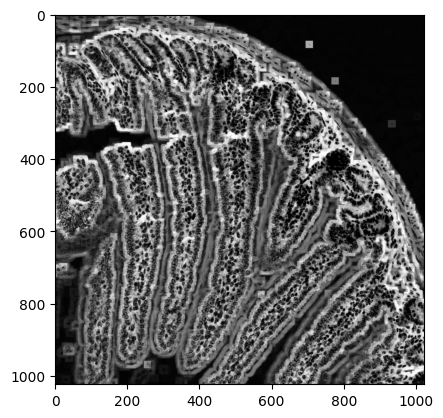

In [46]:
selem = np.ones((20, 20))
test = (dilation(b_eq, footprint=selem) - b_eq)
plt.imshow(test, cmap='gray')
# recon_by_erosion = reconstruction(
#     seed = 


Text(0.5, 1.0, 'Combined Channel')

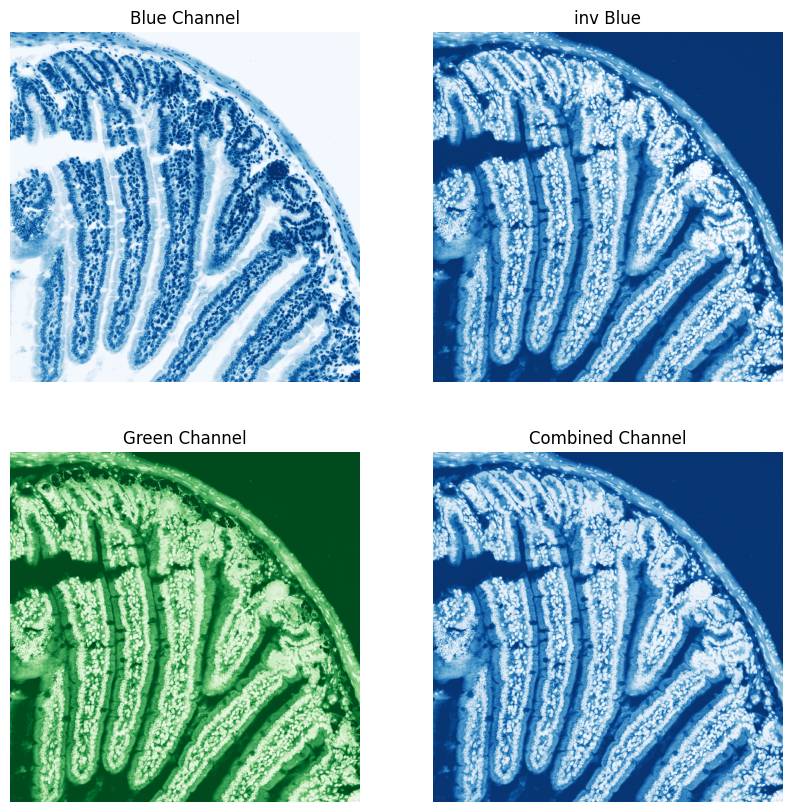

In [47]:
inv = g.max() - b_eq
cap = np.maximum(g, inv)
from skimage.morphology import reconstruction
fig, ax = plt.subplots(2,2, figsize=(10,10))
for i in range(2):
    ax[0,i].axis('off')
    ax[1,i].axis('off')
ax[0,0].imshow(b_eq, cmap='Blues'); ax[0,0].set_title('Blue Channel')
ax[1,0].imshow(cap, cmap='Greens'); ax[1,0].set_title('Green Channel')
ax[0,1].imshow(inv, cmap='Blues'); ax[0,1].set_title('inv Blue')
ax[1,1].imshow(reconstruction(seed=cap, mask=inv, method='erosion'), cmap='Blues'); ax[1,1].set_title('Combined Channel')

cells wrap allong the vili,
at the crypt they loop around
within the crypt there should be a lysoszyme signal
so the most concrete lysozyme signal would be those within the loops of cells


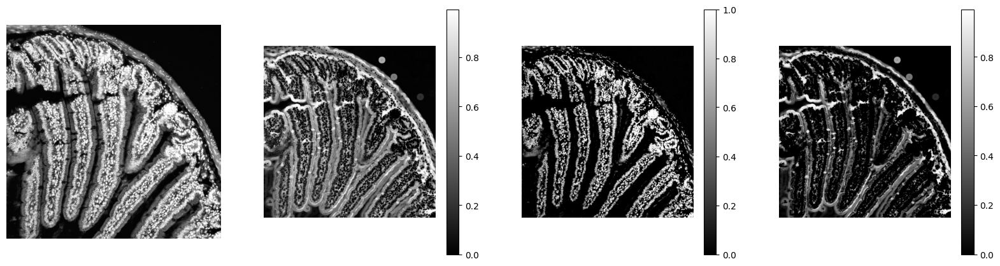

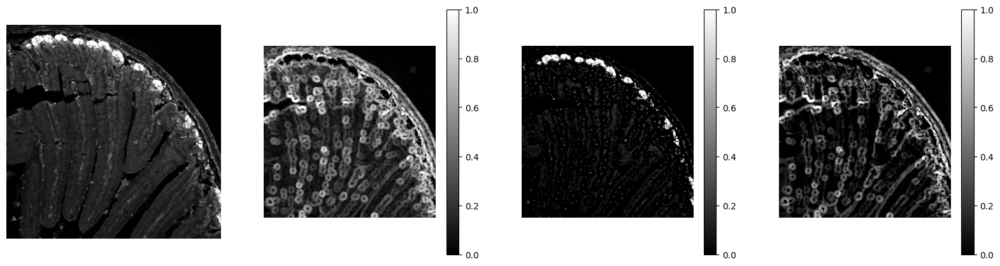

In [48]:
from skimage.morphology import disk, dilation, erosion
selem_small, selem_large = disk(2), disk(20)    

def caps(image, small_r, big_r):
    selem_small, selem_large = disk(small_r), disk(big_r)    
    hats = dilation(image, footprint=selem_large) - dilation(image, footprint=selem_small)
    clean = image - np.minimum(image, hats) 
    troughs = np.maximum(image, hats) - image
    return hats, clean, troughs
#cell_hats = caps(b_eq, 2, 20)

def show_caps(image, small_r, big_r):

    hats, clean, troughs = caps(image, small_r, big_r)

    fig, ax = plt.subplots(1,4, figsize=(20,5))
    ax[0].axis('off'); ax[1].axis('off'); ax[2].axis('off'); ax[3].axis('off');
    ax[0].imshow(image, cmap='gray')
    ax[1].imshow(hats, cmap='gray')
    ax[2].imshow(clean, cmap='gray')
    ax[3].imshow(troughs, cmap='gray')
    fig.colorbar(ax[1].imshow(hats, cmap='gray'), ax=ax[1])
    fig.colorbar(ax[2].imshow(clean, cmap='gray'), ax=ax[2])
    fig.colorbar(ax[3].imshow(troughs, cmap='gray'), ax=ax[3])
    fig.show()
    return hats, clean, troughs


tissue_hats, tissue_clean, tissue_troughs = show_caps(b_eq, 1, 20)
crypt_hats, crypt_clean, crypt_troughs = show_caps(g, 2, 20)



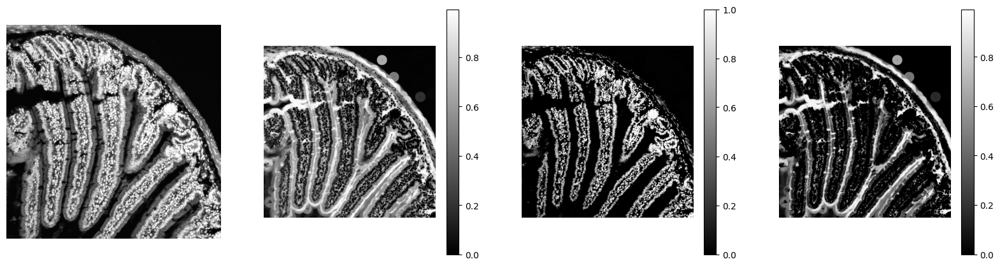

In [49]:
_,_,_ = show_caps(np.maximum(b_eq, tissue_clean), 1, 30)

Text(0.5, 1.0, 'Split Crypts')

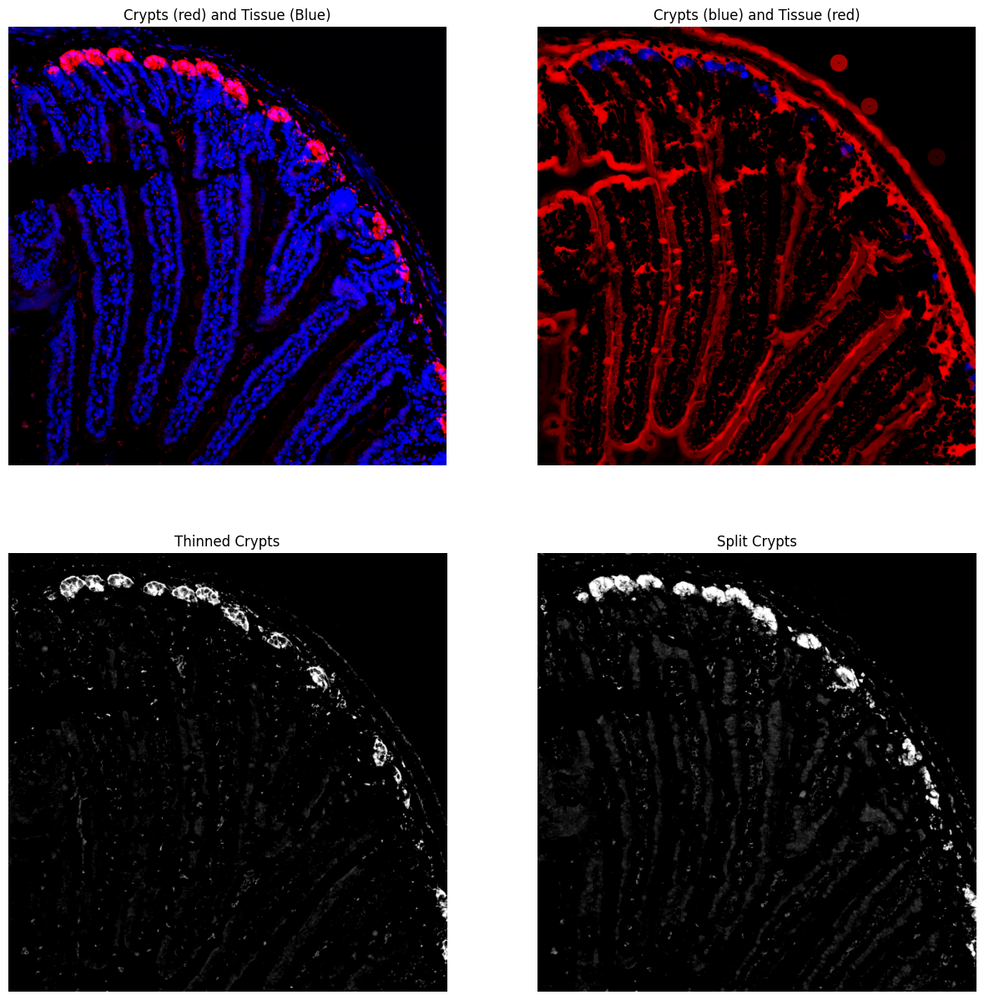

In [50]:
fig, ax = plt.subplots(2,2, figsize=(15,15))
thinned_crypts = crypt_clean - np.minimum(crypt_clean, tissue_clean)
split_crypts = crypt_clean - np.minimum(crypt_clean, tissue_troughs)

ax[0,0].axis('off'); ax[0,1].axis('off'); ax[1,0].axis('off'); ax[1,1].axis('off')

ax[0,0].imshow(np.stack([crypt_clean, np.zeros_like(crypt_clean), tissue_clean ], axis=-1)); ax[0,0].set_title('Crypts (red) and Tissue (Blue)')

ax[0,1].imshow(np.stack([tissue_troughs, np.zeros_like(thinned_crypts) ,minmax(opening(split_crypts**2 * thinned_crypts, footprint = disk(radius=5))**(1/2))], axis=-1)); ax[0,1].set_title('Crypts (blue) and Tissue (red)')


ax[1,0].imshow(thinned_crypts, cmap='gray'); ax[1,0].set_title('Thinned Crypts')
ax[1,1].imshow(split_crypts, cmap='gray'); ax[1,1].set_title('Split Crypts')



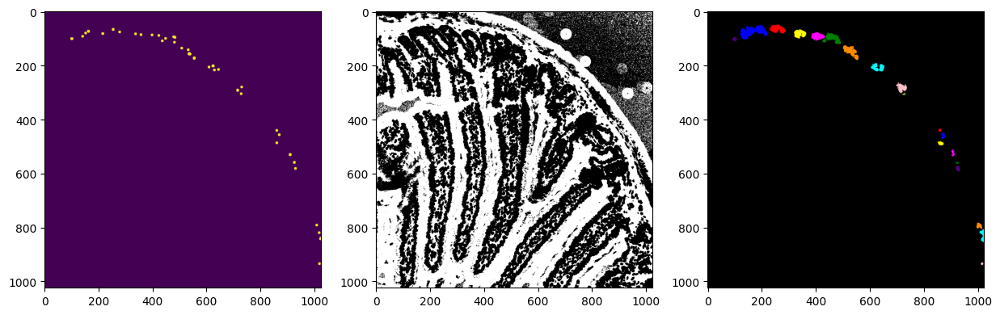

In [51]:
from skimage.segmentation import watershed
from skimage.morphology import local_maxima
from scipy.ndimage import distance_transform_edt
good_crypts = minmax(opening(split_crypts * thinned_crypts, footprint = disk(radius=5))**(1/2))
distance = tissue_troughs - good_crypts

maxi = local_maxima(good_crypts)
from skimage.measure import label
from skimage.color import label2rgb
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax[0].imshow(maxi)
ax[1].imshow(tissue_troughs>good_crypts, cmap='gray')
ax[2].imshow(
    label2rgb(label(watershed(distance, markers = maxi, mask = tissue_troughs<good_crypts)))
)


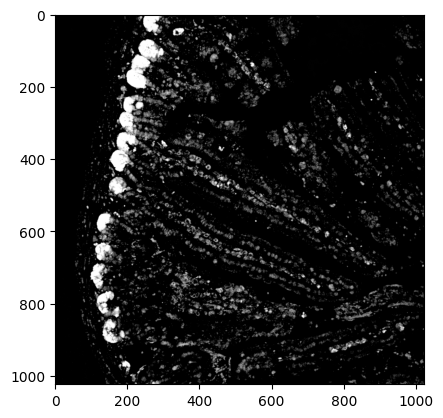

In [ ]:
plt.imshow(minmax(crypt_clean)-np.minimum(minmax(crypt_clean), minmax(combo_hat)), cmap='gray')

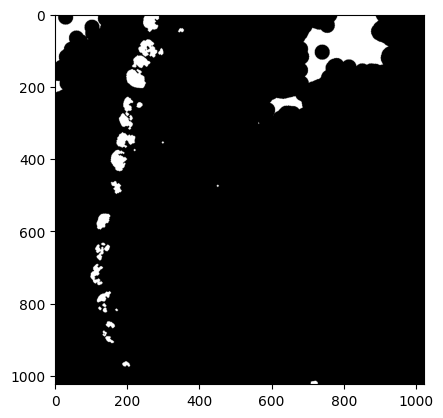

In [ ]:

plt.imshow(dilation(crypt_hats, footprint=disk(1)) <= 0.001, cmap='gray')

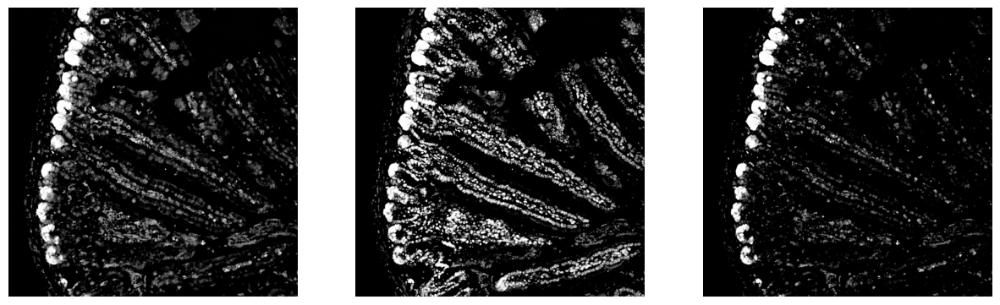

In [ ]:
thinned_crypts = crypt_clean - np.minimum(combo_hat, crypt_clean)
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].axis('off'); ax[1].axis('off'); ax[2].axis('off');
ax[0].imshow(crypt_clean, cmap='gray')
ax[1].imshow(combo_clean, cmap='gray')
ax[2].imshow(thinned_crypts, cmap='gray')
fig.show()